# Overview

## Business Problem

Swire Coca-Cola is struggling to systematically identify the success, profitability, and sales of potential B2B customers. The investment of time, capital, and operating expenses are at risk. Depending on the perceived profitability of the potential customer, Swire can adjust pricing and operational support to make their bid more attractive. 

## Analytic Objective

The purpose of this project is to identify and determine two factors: 


1)    Predict which B2B customer will be successful (exceed the break-even point)

2)    How successful a specific customer will be (projected sales) 

Success will be determined by two metrics: 


1)    How well the utilized analytical models can identify the two factors listed above for both of the following: 

a.     Current customers 

b.     New or future customers


2)    By determining major contributing factors relating to a B2B customer’s success that may have been unknown by previous contributors and stakeholders alike.

## Explorative Quesitons

1.   How do regional sales compare to the inhabited US? 
2.   Which states have the highest sales volums?
3.   Which distribution/sales channels are the most profitable? 
4.   What is the breakdown of profit for the "All other Category"?
5.   Which beverage Category contributes to the majority of sales?
6.   Which type of packaging/bottling contributes to the largest COGS?

### Import Packages

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
from datetime import datetime

### Load Data and View

In [2]:
salesDF = pd.read_csv("FSOP_Sales_Data_v2.0.csv")

# convert from string to date
salesDF['MIN_POSTING_DATE'] = salesDF['MIN_POSTING_DATE'].astype('datetime64[ns]')
salesDF['MAX_POSTING_DATE'] = salesDF['MAX_POSTING_DATE'].astype('datetime64[ns]')

salesDF.head(5)

,CUSTOMER_NUMBER_BLINDED,PRODUCT_SOLD_BLINDED,BEV_CAT_DESC,CALORIE_CAT_DESC,PACK_TYPE_DESC,PACK_SIZE_SALES_UNIT_DESCRIPTION,PHYSICAL_VOLUME,DISCOUNT,INVOICE_PRICE,DEAD_NET,GROSS_PROFIT_DEAD_NET,COGS,MIN_POSTING_DATE,MAX_POSTING_DATE,NUM_OF_TRANSACTIONS
0,C0051046109640797,M056203880974,CORE SPARKLING,REGULAR CALORIE,Plastic Bottle - Contour,20 OZ 1-Ls 24,88.0,2246.40,2505.60,1924.70,1112.73,682.41,2021-01-12,2022-12-30,157
1,C0348074302380406,M042308250090,CORE SPARKLING,LOW CALORIE,Aluminum Can - Sleek,12 OZ 4-Pk 24,58.0,1197.12,1666.92,1468.77,316.19,1185.98,2021-02-02,2022-12-30,40
2,C0277089703710223,M010605530774,TEA,LOW CALORIE,Plastic Bottle - Other,18.5 OZ 1-Ls 12,108.0,3429.00,1755.00,1499.03,403.25,1107.73,2022-03-07,2022-12-30,62
3,C0112072503650635,M050800200648,ENERGY DRINKS,REGULAR CALORIE,Aluminum Can,16 OZ 1-Ls 24,15.0,307.12,592.88,553.18,77.90,475.28,2022-06-09,2022-12-30,17
4,C0305009008200279,M009608400345,CORE SPARKLING,REGULAR CALORIE,Plastic Bottle - Dimple,2 LTR 1-Ls 8,195.0,3382.05,2077.95,1812.90,661.21,1416.99,2021-01-05,2022-12-30,166


In [3]:
salesDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 831858 entries, 0 to 831857
Data columns (total 15 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   CUSTOMER_NUMBER_BLINDED           831858 non-null  object        
 1   PRODUCT_SOLD_BLINDED              831858 non-null  object        
 2   BEV_CAT_DESC                      758235 non-null  object        
 3   CALORIE_CAT_DESC                  758235 non-null  object        
 4   PACK_TYPE_DESC                    831858 non-null  object        
 5   PACK_SIZE_SALES_UNIT_DESCRIPTION  831858 non-null  object        
 6   PHYSICAL_VOLUME                   831858 non-null  float64       
 7   DISCOUNT                          831858 non-null  float64       
 8   INVOICE_PRICE                     831858 non-null  float64       
 9   DEAD_NET                          831858 non-null  float64       
 10  GROSS_PROFIT_DEAD_NET           

In [4]:
# aggregate sales and transactions for each customer then aggregate results. 
# prepares data to be merged with sales data
B2B_partner_sales_aggregate = salesDF.copy()
B2B_partner_sales_aggregate = B2B_partner_sales_aggregate.groupby('CUSTOMER_NUMBER_BLINDED').agg(
    total_profit=pd.NamedAgg(column="GROSS_PROFIT_DEAD_NET", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="NUM_OF_TRANSACTIONS", aggfunc="sum"))

# reset index
B2B_partner_sales_aggregate = B2B_partner_sales_aggregate.reset_index()

# convert total_profit and total_transactions to int
B2B_partner_sales_aggregate['total_profit'] = B2B_partner_sales_aggregate['total_profit'].astype(int)
B2B_partner_sales_aggregate['total_transactions'] = B2B_partner_sales_aggregate['total_transactions'].astype(int)

In [5]:
customersDF = pd.read_csv("FSOP_Customer_Data_v2.0.csv")

customersDF.head(5)

,CUSTOMER_NUMBER_BLINDED,SALES_OFFICE_DESCRIPTION,DELIVERY_PLANT_DESCRIPTION,ON_BOARDING_DATE,ADDRESS_CITY,ADDRESS_ZIP_CODE,COUNTY,GEO_LONGITUDE,GEO_LATITUDE,CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION,CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION,BUSINESS_TYPE_EXTENSION_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION2,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION
0,C0895044502170683,"Tucson, AZ","Tucson, AZ",2017-02-06,TUCSON,85756-6948,PIMA,-110.928378,32.115937,Other Shopping & Ser,General Merchandiser,Other General Mercha,DSD,General Merchandiser,FSOP,RETAIL
1,C0409008701210025,"Tacoma, WA","Tacoma Sales Center, WA",2009-05-11,FORT LEWIS,98433,PIERCE,-122.587244,47.102365,Eating & Drinking,Quick Service Restau,QSR-Pizza,DSD,Quick Service Restau,FSOP,EATING/DRINKING
2,C0278065006510168,"Walla Walla, WA","Walla Walla, WA",2004-02-18,COLLEGE PLACE,99324-9730,WALLA WALLA,-118.373040,46.052920,Other Shopping & Ser,General Merchandiser,Hardware/Home-Improv,DSD,General Merchandiser,FSOP,RETAIL
3,C0559043803480412,"Prescott, AZ","Glendale, AZ",1993-09-03,PRESCOTT,86301-3313,YAVAPAI,-112.450490,34.545020,Travel/Transportatio,Lodging,Other Lodging,DSD,Lodging,FSOP,LODGING
4,C0729091103720749,"Reno, NV","Reno, NV",2014-12-17,SOUTH LAKE TAHOE,96150-7702,EL DORADO,-119.984227,38.926637,Other Shopping & Ser,Automotive Services,Other Automotive Ser,DSD,Automotive Services,FSOP,RETAIL


### Main Customer Data Joined to Sales Data
This dataframe is broken out by CUSTOMER_NUMBER_BLINDED

In [6]:
copy_customersDF = customersDF.copy()
df_customer_salesDF = copy_customersDF.set_index('CUSTOMER_NUMBER_BLINDED').join(B2B_partner_sales_aggregate.set_index('CUSTOMER_NUMBER_BLINDED'))

df_customer_salesDF = df_customer_salesDF.reset_index()

df_customer_salesDF['STATE'] = df_customer_salesDF['DELIVERY_PLANT_DESCRIPTION'].str[-2:]

df_customer_salesDF.head(5)
#df_customer_salesDF.to_excel("customer_salesDF.xlsx")

,CUSTOMER_NUMBER_BLINDED,SALES_OFFICE_DESCRIPTION,DELIVERY_PLANT_DESCRIPTION,ON_BOARDING_DATE,ADDRESS_CITY,ADDRESS_ZIP_CODE,COUNTY,GEO_LONGITUDE,GEO_LATITUDE,CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION,CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION,BUSINESS_TYPE_EXTENSION_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION2,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION,total_profit,total_transactions,STATE
0,C0895044502170683,"Tucson, AZ","Tucson, AZ",2017-02-06,TUCSON,85756-6948,PIMA,-110.928378,32.115937,Other Shopping & Ser,General Merchandiser,Other General Mercha,DSD,General Merchandiser,FSOP,RETAIL,171913,5477,AZ
1,C0409008701210025,"Tacoma, WA","Tacoma Sales Center, WA",2009-05-11,FORT LEWIS,98433,PIERCE,-122.587244,47.102365,Eating & Drinking,Quick Service Restau,QSR-Pizza,DSD,Quick Service Restau,FSOP,EATING/DRINKING,25377,3245,WA
2,C0278065006510168,"Walla Walla, WA","Walla Walla, WA",2004-02-18,COLLEGE PLACE,99324-9730,WALLA WALLA,-118.373040,46.052920,Other Shopping & Ser,General Merchandiser,Hardware/Home-Improv,DSD,General Merchandiser,FSOP,RETAIL,38728,4111,WA
3,C0559043803480412,"Prescott, AZ","Glendale, AZ",1993-09-03,PRESCOTT,86301-3313,YAVAPAI,-112.450490,34.545020,Travel/Transportatio,Lodging,Other Lodging,DSD,Lodging,FSOP,LODGING,2921,375,AZ
4,C0729091103720749,"Reno, NV","Reno, NV",2014-12-17,SOUTH LAKE TAHOE,96150-7702,EL DORADO,-119.984227,38.926637,Other Shopping & Ser,Automotive Services,Other Automotive Ser,DSD,Automotive Services,FSOP,RETAIL,2289,534,NV


### Map Plot of Sales + Transactions of B2B Partners

This visual is not neccessarily specific to this analysis. However, it is and interactive plot and is useful when looking into where the most profitable B2B partners specifically reside, and any sales trends associated with location. 

#### We can see that sales, for the most part, do trend around densily populated areas. 
#### Therefore, we might form a hypothese that potential B2B customers should live within a certain radius of densily populated areas

In [7]:
# Reference: https://plotly.com/python/mapbox-layers/     +    https://plotly.com/python/scattermapbox/     +    https://plotly.com/python/reference/layout/mapbox/

import plotly.express as px

fig = px.scatter_mapbox(df_customer_salesDF, lat="GEO_LATITUDE", lon="GEO_LONGITUDE", hover_name="ADDRESS_CITY", hover_data=["total_profit", "total_transactions"],color="total_profit",
                        color_continuous_scale=px.colors.sequential.Plasma, zoom=4, height=500, size ="total_transactions")

# fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(mapbox_style="stamen-toner")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#### Highlighted below are the most dently populated areas in which Swire's B2B partners reside. 

<img src="US_pop2.png" width="1000" height="1300">

### Aggregate Data by Sate

In [8]:
# aggregate sales and transactions for each customer then aggregate results
copy_df_customer_salesDF = df_customer_salesDF.copy()
B2B_partner_sales_STATE = copy_df_customer_salesDF.groupby('STATE').agg(
    total_profit=pd.NamedAgg(column="total_profit", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="total_transactions", aggfunc="sum"))

# reset index
B2B_partner_sales_STATE = B2B_partner_sales_STATE.reset_index()

# convert total_profit and total_transactions to int
B2B_partner_sales_STATE['total_profit'] = B2B_partner_sales_STATE['total_profit'].astype(int)
B2B_partner_sales_STATE['total_transactions'] = B2B_partner_sales_STATE['total_transactions'].astype(int)

###  Southwest, specifically AZ, and the Pacific Northweast, specifically WA contribute to the most sales. . This means geographically,  Swire-Cocola can look into some distribution cost saving initiatives with regards to their B2B partners. 
#
### This data should also be compared to US Census data specifically population by state
#
#### [State GDP]            AZ = 341.8b     CO = 371.3b     WA = 577.2b       UT = 185.2b  OR = 229.5b      ID = 78.9b NM = 95.3b         NV = 159.5b      WY = 36.0b     NE = 122.7b
#### [State Population] AZ = 7,326,692 CO = 5,849,409 WA = 7,799,415 UT = 185.2b  OR = 4,264,303 ID = 78.9b NM = 2,120,399  NV = 3,179,324 WY = 578,756 NE = 1,974,166 


In [9]:

# Credit: https://www.ibisworld.com/united-states/economic-profiles/

# Sort data for table
B2B_partner_sales_STATE = B2B_partner_sales_STATE.sort_values(by=['total_profit'], ascending=False)

# convert total_profit and total_transactions to int
B2B_partner_sales_STATE['total_profit'] = B2B_partner_sales_STATE['total_profit'].astype(int).map('{:,.0f}'.format)
B2B_partner_sales_STATE['total_transactions'] = B2B_partner_sales_STATE['total_transactions'].astype(int).map('{:,.0f}'.format)

import plotly.graph_objects as go

headerColor = 'grey'
rowEvenColor = 'lightgrey'
rowOddColor = 'white'

fig = go.Figure(data=[go.Table(
  header=dict(
    values=['<b>State</b>','<b>Total Profit</b>','<b>Total Transactions</b>'],
    line_color='darkslategray',
    fill_color=headerColor,
    align=['left','center'],
    font=dict(color='white', size=35)
  ),
  cells=dict(
    values=B2B_partner_sales_STATE.transpose().values.tolist(),
    line_color='darkslategray',
    # 2-D list of colors for alternating rows
    fill_color = [[rowOddColor,rowEvenColor,rowOddColor, rowEvenColor,rowOddColor]*5],
    align = ['left', 'center'],
    font = dict(color = 'black', size = 15)
    ))
])

fig.show()

In [10]:
# aggregate sales and transactions for each customer then aggregate results
copy_df_customer_salesDF = df_customer_salesDF.copy()
channel_salesDF = copy_df_customer_salesDF.groupby('CUSTOMER_TRADE_CHANNEL_DESCRIPTION').agg(
    total_profit=pd.NamedAgg(column="total_profit", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="total_transactions", aggfunc="sum"))

# convert total_profit and total_transactions to int
channel_salesDF['total_profit'] = channel_salesDF['total_profit'].astype(int)
channel_salesDF['total_transactions'] = channel_salesDF['total_transactions'].astype(int)

channel_salesDF = channel_salesDF.sort_values(by=['total_profit'], ascending=False)

# reset index
channel_salesDF = channel_salesDF.reset_index()

#### It should be noted that the channel "All Other" is a significant contibuter of total profit and needs further investigation

In [11]:
import plotly.express as px

fig = px.bar(channel_salesDF, x='CUSTOMER_TRADE_CHANNEL_DESCRIPTION', y='total_profit',
             hover_data=['total_transactions'], color='total_profit',
             title="Profitability by Channel", height=700)
fig.show()

In [12]:
filtered_channelDF = df_customer_salesDF[df_customer_salesDF['CUSTOMER_TRADE_CHANNEL_DESCRIPTION'] == 'All Other'] 

In [13]:
# aggregate sales and transactions for each customer then aggregate results

filtered_channelDF = filtered_channelDF.groupby('CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION').agg(
    total_profit=pd.NamedAgg(column="total_profit", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="total_transactions", aggfunc="sum"))

# convert total_profit and total_transactions to int
filtered_channelDF['total_profit'] = filtered_channelDF['total_profit'].astype(int)
filtered_channelDF['total_transactions'] = filtered_channelDF['total_transactions'].astype(int)

filtered_channelDF = filtered_channelDF.sort_values(by=['total_profit'], ascending=False)

# reset index
filtered_channelDF = filtered_channelDF.reset_index()

# filtered_channelDF = 
channel_salesDF[channel_salesDF['CUSTOMER_TRADE_CHANNEL_DESCRIPTION'] == 'All Other'] 

,CUSTOMER_TRADE_CHANNEL_DESCRIPTION,total_profit,total_transactions
0,All Other,56652728,1993848


#### Since the "All Other" category make up about 56M of sales, we should figure out what each of the subcategories means for Swire's business

In [14]:
import plotly.express as px

fig = px.bar(filtered_channelDF, x='CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION', y='total_profit',
             hover_data=['total_transactions'], color='total_profit',
             title="Profitability by Channel = \"All Other\"", height=500)
fig.show()

## Beverage Category Sales

In [15]:
# aggregate sales and transactions for each customer then aggregate results
copy_salesDF = salesDF.copy()
category_DF = copy_salesDF.groupby('BEV_CAT_DESC').agg(
    total_profit=pd.NamedAgg(column="GROSS_PROFIT_DEAD_NET", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="NUM_OF_TRANSACTIONS", aggfunc="sum"))

# convert total_profit and total_transactions to int
category_DF['total_profit'] = category_DF['total_profit'].astype(int)
category_DF['total_transactions'] = category_DF['total_transactions'].astype(int)

category_DF = category_DF.sort_values(by=['total_profit'], ascending=False)

# reset index
category_DF = category_DF.reset_index()

### It's easy to tell here which Beverage Category is the largest contributer. A future breakdown of this category may reveal additional insight and strategy.

In [16]:
# [Question] Which beverage Category contributes to the majority of sales
# [Insight]  The majority of bevereage being "Core sparkling" could be due to many factorys. 1) Representative of customer tastes 2) Lack in the correct product marketing 
#            3) The majoirty of B2B being attributed to fountain drinks 

import plotly.express as px

fig = px.bar(category_DF, x='BEV_CAT_DESC', y='total_profit',
             hover_data=['total_transactions'], color='total_profit',
             title="Profitability by Beverage Category", height=700)
fig.show()

## Beverage COGS

In [17]:
# aggregate sales and transactions for each customer then aggregate results
cogs_DF = salesDF.copy()
cogs_DF = salesDF.groupby('PACK_TYPE_DESC').agg(
    COGS=pd.NamedAgg(column="COGS", aggfunc="sum"),
    PHYSICAL_VOLUME=pd.NamedAgg(column="PHYSICAL_VOLUME", aggfunc="sum"))

# # convert total_profit and total_transactions to int
# cogs_DF['total_profit'] = cogs_DF['COGS'].astype(int)
# cogs_DF['total_transactions'] = cogs_DF['PHYSICAL_VOLUME'].astype(int)

cogs_DF = cogs_DF.sort_values(by=['COGS'], ascending=False)

# reset index
cogs_DF = cogs_DF.reset_index()

#### Fairly strightforward, we are again easily able to discern that Fountain drinks contribute the largest amount of COGS. Further analysis of profit should be compared against this data for optimizaiton purposes. 

In [18]:
# [Question] Which type of packaging/bottling contributes to the largest COGS
# [Insight] Pliable plastic bag containing syrup packaged in a cardboard box service fountain customer outlets contributes to the largest COGS

import plotly.express as px

fig = px.bar(cogs_DF, x='PACK_TYPE_DESC', y='COGS',
             hover_data=['PHYSICAL_VOLUME'], color='COGS',
             title="COGS by Packaging Type", height=700)
fig.show()

## Results

Overall some great insight was obtained. Looking further into the relationship of location with regards to drink category may provide a strong relationship with regards to B2B partner profitability and success. I would recommned further investigation into the relationship of COGS and B2B partner success. The two could provide a strong relationship and contribute to overall profit. The "All Other" channel does raise some red flags with regards to what exactly makes up this category. Almost $ 56M can be attributed to that channel so it is worth investigating. Population growth and sales location will definately play a part in predicting longevity as well as GDP for a state. We will either see well established successful B2B partners in GDP/Population stable areas, or we could also see successful B2B partners in areas with a rising GDP and rising populaition meaning there is economic growth (for example Phoenix, AZ). In areas that have been exhibiting robust populaitoin/GDP growth a more aggressive approach to pricing could easily capture business. This strategy could be tailered to regional tastes and competition. 

# Modeling

### 1) List an appropriate set of models to explore (with respect to the business problem and the project objective).

1) Linear Regression on Customer Lifetime Value
2) Random Forest Regression on Customer Lifetime Value
2) Gradient Boosted Model (XGBoost) also on Customer Lifetime Value

The target varialbe  is Customer Lifetime Value. This metric helps to predict customer profitability and longevity. We can use this metric to figure out if a customer is worth investing in. This metric has been setup to predict the customer life time value for a limited relationship of one year (output results from the models). For example, how much profit will be expected after one year of the relationship. We can then extrapolate this for 3 years or even 5 years if needed. If the break-even point after total investment in the customer is 2.5 years (an approximate provided by Swire), we can then predict how much a relationship with the customer will be worth after 2.5 years of business. Swire then can figure out if any fixed costs have been covered in that timeframe and if the customer will be, compared to the 2.5 year average, profitable. 

### 2) Do additional data preparation and feature engineering as necessary. 

### CLTV = Average Monetary Value per transaction x Expected Number of transactions per year x Expected Tenure in years

Average Monetary Value = total gross / # of transactions

Expected number of transactioins per year = Total transactions/ Total months active = transactons per month.  transactons per month x 12. = transactions per year

Expected Tenure in years 

In [19]:
cltvDF = salesDF.copy()
cltvDF = salesDF.groupby('CUSTOMER_NUMBER_BLINDED').agg(
    total_profit=pd.NamedAgg(column="GROSS_PROFIT_DEAD_NET", aggfunc="sum"),
    total_transactions=pd.NamedAgg(column="NUM_OF_TRANSACTIONS", aggfunc="sum"),
    MIN_Date=pd.NamedAgg(column='MIN_POSTING_DATE', aggfunc="min"),
    MAX_Date=pd.NamedAgg(column='MAX_POSTING_DATE', aggfunc="max"))
# reset index
cltvDF = cltvDF.reset_index()

# convert total_profit and total_transactions to int
cltvDF['total_profit'] = cltvDF['total_profit'].astype(int)
cltvDF['total_transactions'] = cltvDF['total_transactions'].astype(int)


In [20]:
cltvDF['Duration'] = round(((cltvDF.MAX_Date - cltvDF.MIN_Date)/np.timedelta64(1, 'M')),2)

In [21]:
# Define a function to calculate average profit per month
def avg_profit_per_month(row):
    if row['total_profit'] != 0 and row['Duration'] == 0:
        return row['total_profit']
    elif row['total_profit'] == 0 and row['Duration'] == 0:
        return 0
    elif row['total_profit'] == 0 and row['Duration'] > 0:
        return 0
    else: 
        return row['total_profit'] / row['Duration']
    
# row['total_profit'] > 0 and row['Duration'] > 0:
# Apply the function to each row of the dataframe
cltvDF['avg_profit_per_month'] = cltvDF.apply(avg_profit_per_month, axis=1)

In [22]:
# Check for NA/NaN values
cltvDF.isna().sum().sum()

0

In [23]:
cltvDF['avg_profit_per_month'] = round(cltvDF['avg_profit_per_month'],2)
cltvDF['Avg_Profit_perYear'] = cltvDF['avg_profit_per_month'] * 12

In [24]:
cltvDF.head()

,CUSTOMER_NUMBER_BLINDED,total_profit,total_transactions,MIN_Date,MAX_Date,Duration,avg_profit_per_month,Avg_Profit_perYear
0,C0001004007230617,0,4,2022-11-05,2022-12-03,0.92,0.00,0.00
1,C0001004306830869,0,6,2022-12-03,2022-12-03,0.00,0.00,0.00
2,C0001005009010198,406,45,2021-06-10,2022-11-25,17.51,23.19,278.28
3,C0001006902500643,2881,680,2021-02-03,2022-12-31,22.87,125.97,1511.64
4,C0001007600510372,1262,53,2021-01-11,2022-12-22,23.33,54.09,649.08


In [25]:
cltvDF.describe()

,total_profit,total_transactions,Duration,avg_profit_per_month,Avg_Profit_perYear
count,4.039000e+04,40390.000000,40390.000000,40390.000000,4.039000e+04
mean,6.074743e+03,437.180193,15.960298,354.918069,4.259017e+03
std,3.326651e+04,1040.127208,8.583958,1693.764483,2.032517e+04
min,-7.950400e+04,1.000000,0.000000,-6600.000000,-7.920000e+04
25%,2.790000e+02,34.000000,8.380000,36.112500,4.333500e+02
50%,1.438500e+03,131.000000,20.070000,110.615000,1.327380e+03
75%,4.542750e+03,462.000000,23.460000,274.695000,3.296340e+03
max,2.528505e+06,47069.000000,23.920000,110559.900000,1.326719e+06


In [26]:
# used to quickly evaluate data integrity 
# cltvDF.to_csv('cltvDF.csv',index=False,)  

##### Drop rows with null values

In [27]:
cltvDF.isna().sum().sum()

0

##### Calculate AOV (Average order value)

In [28]:
# Average Order Value(AOV): The Average Order value is the ratio of your total revenue and the total number of orders. 
# AOV represents the mean amount of revenue that the customer spends on an order.
cltvDF['avg_order_value']= round(cltvDF['total_profit']/cltvDF['total_transactions'],2)

##### Calculate the average purchase_frequency

In [29]:
# Purchase Frequency(PF): Purchase Frequency is the ratio of the total number of orders and the total number of customer. 
# It represents the average number of orders placed by each customer.
# EDIT NOTE: Possibly replace for medium or a combination of the two
average_purchase_frequency=sum(cltvDF['total_transactions'])/cltvDF.shape[0]
average_purchase_frequency

437.1801931171082

##### Calculate the medium purchase_frequency

In [30]:
# Calculate median purchase frequency
medium_purchase_frequency = np.median(cltvDF['total_transactions'])# / cltvDF.shape[0]
medium_purchase_frequency

131.0

In [31]:
# average of both average_purchase_frequency and medium_purchase_frequency
smoothed_purchase_frequency = (average_purchase_frequency+medium_purchase_frequency)/2
smoothed_purchase_frequency

284.09009655855414

#### Calculate Churn

In [32]:
# calculate days inactive from end of year. In theory this was be days in active minus the current date.
cltvDF['days_inactive'] = (datetime.strptime('2023-01-01 00:00:00', '%Y-%m-%d %H:%M:%S') - cltvDF['MAX_Date'][:]).dt.days

In [33]:
# Repeat Rate: Repeat rate can be defined as the ratio of the number of customers with more than one order to the number of unique customers.
# Example: If you have 10 customers in a month out of who 4 come back, your repeat rate is 40%.
# EDIT CHECK
repeat_rate=cltvDF[(cltvDF.total_transactions > 1) & (cltvDF.days_inactive < 90)].shape[0]/cltvDF.shape[0]
repeat_rate

0.738177766773954

In [34]:
# Churn Rate: Churn Rate is the percentage of customers who have not ordered again.
churn_rate=1-repeat_rate
churn_rate

0.26182223322604603

##### Calcualte Customer Lifetime Value

In [35]:
#Customer Lifetime Value
cltvDF['cust_lifetime_value']=(cltvDF['avg_order_value']*smoothed_purchase_frequency)/churn_rate

In [36]:
cltvDF.head()

,CUSTOMER_NUMBER_BLINDED,total_profit,total_transactions,MIN_Date,MAX_Date,Duration,avg_profit_per_month,Avg_Profit_perYear,avg_order_value,days_inactive,cust_lifetime_value
0,C0001004007230617,0,4,2022-11-05,2022-12-03,0.92,0.00,0.00,0.00,29,0.000000
1,C0001004306830869,0,6,2022-12-03,2022-12-03,0.00,0.00,0.00,0.00,29,0.000000
2,C0001005009010198,406,45,2021-06-10,2022-11-25,17.51,23.19,278.28,9.02,37,9787.146948
3,C0001006902500643,2881,680,2021-02-03,2022-12-31,22.87,125.97,1511.64,4.24,1,4600.610096
4,C0001007600510372,1262,53,2021-01-11,2022-12-22,23.33,54.09,649.08,23.81,10,25835.029805


##### Retreive each customer's most profitable products

In [37]:
product_salesDF = salesDF.copy()
product_salesDF = salesDF.groupby(['CUSTOMER_NUMBER_BLINDED','BEV_CAT_DESC','CALORIE_CAT_DESC','PACK_TYPE_DESC']).agg(
    total_profit=pd.NamedAgg(column="GROSS_PROFIT_DEAD_NET", aggfunc="sum"),
     COGS=pd.NamedAgg(column="COGS", aggfunc="sum"))
    
    
# reset index
product_salesDF = product_salesDF.reset_index()

# convert total_profit and total_transactions to int
# product_salesDF['total_profit'] = product_salesDF['total_profit'].astype(int)
# product_salesDF['COGS'] = product_salesDF['COGS'].astype(int)
product_salesDF.head(25)

# testDF = product_salesDF[product_salesDF['CUSTOMER_NUMBER_BLINDED'] == 'C0001005009010198']
# testDF.head(5)

customer_list = product_salesDF['CUSTOMER_NUMBER_BLINDED']
customer_list = customer_list.unique().tolist()

p_salesDF = pd.DataFrame(columns = ['CUSTOMER_NUMBER_BLINDED', 'BEV_CAT_DESC', 'CALORIE_CAT_DESC', 'PACK_TYPE_DESC', 'total_profit', 'COGS'])

for customer in customer_list:
    df = product_salesDF[product_salesDF['CUSTOMER_NUMBER_BLINDED'] == customer].sort_values(by='total_profit', ascending=False)
    df = df.head(1)
    p_salesDF = pd.concat([p_salesDF,df])

### Prep Data For Modeling

In [38]:
p_salesDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40313 entries, 0 to 316115
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   CUSTOMER_NUMBER_BLINDED  40313 non-null  object
 1   BEV_CAT_DESC             40313 non-null  object
 2   CALORIE_CAT_DESC         40313 non-null  object
 3   PACK_TYPE_DESC           40313 non-null  object
 4   total_profit             40313 non-null  object
 5   COGS                     40313 non-null  object
dtypes: object(6)
memory usage: 2.2+ MB


In [39]:
productSales_simplifiedDF = p_salesDF[['CUSTOMER_NUMBER_BLINDED','BEV_CAT_DESC', 'CALORIE_CAT_DESC', 'PACK_TYPE_DESC']]
productSales_simplifiedDF.head()

,CUSTOMER_NUMBER_BLINDED,BEV_CAT_DESC,CALORIE_CAT_DESC,PACK_TYPE_DESC
0,C0001004007230617,CORE SPARKLING,LOW CALORIE,Aluminum Can
2,C0001004306830869,CORE SPARKLING,LOW CALORIE,Aluminum Can
7,C0001005009010198,CORE SPARKLING,REGULAR CALORIE,Aluminum Can - Sleek
14,C0001006902500643,ENERGY DRINKS,REGULAR CALORIE,Aluminum Can
19,C0001007600510372,CORE SPARKLING,REGULAR CALORIE,Bag-In-Box


In [40]:
customersDF.head(3)

,CUSTOMER_NUMBER_BLINDED,SALES_OFFICE_DESCRIPTION,DELIVERY_PLANT_DESCRIPTION,ON_BOARDING_DATE,ADDRESS_CITY,ADDRESS_ZIP_CODE,COUNTY,GEO_LONGITUDE,GEO_LATITUDE,CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION,CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION,BUSINESS_TYPE_EXTENSION_DESCRIPTION,CUSTOMER_TRADE_CHANNEL_DESCRIPTION2,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION
0,C0895044502170683,"Tucson, AZ","Tucson, AZ",2017-02-06,TUCSON,85756-6948,PIMA,-110.928378,32.115937,Other Shopping & Ser,General Merchandiser,Other General Mercha,DSD,General Merchandiser,FSOP,RETAIL
1,C0409008701210025,"Tacoma, WA","Tacoma Sales Center, WA",2009-05-11,FORT LEWIS,98433,PIERCE,-122.587244,47.102365,Eating & Drinking,Quick Service Restau,QSR-Pizza,DSD,Quick Service Restau,FSOP,EATING/DRINKING
2,C0278065006510168,"Walla Walla, WA","Walla Walla, WA",2004-02-18,COLLEGE PLACE,99324-9730,WALLA WALLA,-118.373040,46.052920,Other Shopping & Ser,General Merchandiser,Hardware/Home-Improv,DSD,General Merchandiser,FSOP,RETAIL


# TESTING

In [41]:
customerSimplifiedDF = customersDF[['CUSTOMER_NUMBER_BLINDED','MARKET_DESCRIPTION','COLD_DRINK_CHANNEL_DESCRIPTION']] # simple model
customerComplexDF = customersDF[['CUSTOMER_NUMBER_BLINDED','MARKET_DESCRIPTION','COLD_DRINK_CHANNEL_DESCRIPTION','CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION', 'CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION','BUSINESS_TYPE_EXTENSION_DESCRIPTION']] # simple model

In [42]:
customerComplexDF[customerComplexDF['BUSINESS_TYPE_EXTENSION_DESCRIPTION']== 'Agency']
customerComplexDF['BUSINESS_TYPE_EXTENSION_DESCRIPTION'].unique()

array(['DSD', 'Agency', 'Equipment Only', 'Agency/Lcl Dr.Pepper',
       'Secondary Volume', 'ARTM Distributor', 'Contract/Bid',
       'Spcl Evnt: One Time', 'Spcl Evnt: Recurring',
       'National Dr. Pepper', 'Local Dr. Pepper', 'Return To Vendor'],
      dtype=object)

In [43]:
cltvSimplifiedDF =cltvDF[['CUSTOMER_NUMBER_BLINDED','total_transactions','Duration','avg_order_value','days_inactive','cust_lifetime_value']]
# cltvSimplifiedDF =cltvDF[['CUSTOMER_NUMBER_BLINDED','total_transactions','cust_lifetime_value']]

cltvComplexDF =cltvDF[['CUSTOMER_NUMBER_BLINDED','total_transactions','Duration','avg_order_value','days_inactive','cust_lifetime_value']]
# cltvComplexDF =cltvDF[['CUSTOMER_NUMBER_BLINDED','total_transactions','cust_lifetime_value']]
cltvSimplifiedDF.head(3)

,CUSTOMER_NUMBER_BLINDED,total_transactions,Duration,avg_order_value,days_inactive,cust_lifetime_value
0,C0001004007230617,4,0.92,0.00,29,0.000000
1,C0001004306830869,6,0.00,0.00,29,0.000000
2,C0001005009010198,45,17.51,9.02,37,9787.146948


In [44]:
customerSimplifiedDF.head(3)

,CUSTOMER_NUMBER_BLINDED,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION
0,C0895044502170683,FSOP,RETAIL
1,C0409008701210025,FSOP,EATING/DRINKING
2,C0278065006510168,FSOP,RETAIL


In [45]:
productSales_simplifiedDF.head(3)

,CUSTOMER_NUMBER_BLINDED,BEV_CAT_DESC,CALORIE_CAT_DESC,PACK_TYPE_DESC
0,C0001004007230617,CORE SPARKLING,LOW CALORIE,Aluminum Can
2,C0001004306830869,CORE SPARKLING,LOW CALORIE,Aluminum Can
7,C0001005009010198,CORE SPARKLING,REGULAR CALORIE,Aluminum Can - Sleek


##### Join Data together to create Dataframe used by MODEL

In [46]:
simpleModelDF = customerSimplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED').join(productSales_simplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED'))
simpleModelDF = simpleModelDF.reset_index()

In [47]:
complexModelDF = customerComplexDF.set_index('CUSTOMER_NUMBER_BLINDED').join(productSales_simplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED'))
complexModelDF = complexModelDF.reset_index()

In [48]:
# Eliminate any rows containing CO2-Tank or Plastic Pouch, and drop nan values 
simpleModelDF = simpleModelDF[simpleModelDF['PACK_TYPE_DESC'] != 'CO2 Tank']
simpleModelDF = simpleModelDF[simpleModelDF['PACK_TYPE_DESC'] != 'Plastic Pouch']
simpleModelDF = simpleModelDF.dropna()


In [49]:
# Eliminate any rows containing CO2-Tank or Plastic Pouch, and drop nan values 
complexModelDF = complexModelDF[complexModelDF['PACK_TYPE_DESC'] != 'CO2 Tank']
complexModelDF = complexModelDF[complexModelDF['PACK_TYPE_DESC'] != 'Plastic Pouch']
complexModelDF = complexModelDF.dropna()


##### Simplyfy the PACK_TYPE_DESC column 

In [50]:
def get_new_value(row):
    if 'Plastic' in row:
        return 'Plastic Bottle'
    elif 'Bag-In-Box' in row:
        return 'Bag-In-Box'
    elif 'Aluminum' in row:
        return 'Aluminum Can'
    elif 'Glass' in row:
        return 'Glass Bottle'   

simpleModelDF['productType_simplified'] = simpleModelDF['PACK_TYPE_DESC'].apply(lambda x: get_new_value(x))
complexModelDF['productType_simplified'] = complexModelDF['PACK_TYPE_DESC'].apply(lambda x: get_new_value(x))

In [51]:
simpleModelDF['productType_simplified'].value_counts()

Plastic Bottle    17807
Bag-In-Box        13424
Aluminum Can       5316
Glass Bottle       2334
Name: productType_simplified, dtype: int64

In [52]:
complexModelDF['productType_simplified'].value_counts()

Plastic Bottle    17807
Bag-In-Box        13424
Aluminum Can       5316
Glass Bottle       2334
Name: productType_simplified, dtype: int64

In [53]:
# modelDF = customerSimplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED').join(productSales_simplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED'))
# modelDF = modelDF.reset_index()
simpleModelDF = simpleModelDF.set_index('CUSTOMER_NUMBER_BLINDED').join(cltvSimplifiedDF.set_index('CUSTOMER_NUMBER_BLINDED'))
simpleModelDF = simpleModelDF.reset_index()

complexModelDF = complexModelDF.set_index('CUSTOMER_NUMBER_BLINDED').join(cltvComplexDF.set_index('CUSTOMER_NUMBER_BLINDED'))
complexModelDF = complexModelDF.reset_index()

In [54]:
# simpleModelDF.set_index('CUSTOMER_NUMBER_BLINDED', inplace=True)
# complexModelDF.set_index('CUSTOMER_NUMBER_BLINDED', inplace=True)
simpleModelDF = simpleModelDF.drop(['CUSTOMER_NUMBER_BLINDED'], axis=1)
complexModelDF = complexModelDF.drop(['CUSTOMER_NUMBER_BLINDED'], axis=1)

In [55]:
# dorp PACK_TYPE_DESC column
simpleModelDF = simpleModelDF.drop(['PACK_TYPE_DESC'], axis=1)
complexModelDF = complexModelDF.drop(['PACK_TYPE_DESC'], axis=1)

##### Output data to CSV to be used by R

In [56]:
# simpleModelDF.to_csv('simpleModelDF.csv',index=False,)  

##### Prediction Model for CLTV

In [57]:
# https://www.datacamp.com/tutorial/customer-life-time-value
# https://www.datacamp.com/cheat-sheet/chatgpt-cheat-sheet-data-science

In [58]:
simpleModelDF = simpleModelDF.rename(columns = {'cust_lifetime_value':'customer_lifetime_value'})
complexModelDF = complexModelDF.rename(columns = {'cust_lifetime_value':'customer_lifetime_value'})


In [60]:
simpleModelDF.head(3)

,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION,BEV_CAT_DESC,CALORIE_CAT_DESC,productType_simplified,total_transactions,Duration,avg_order_value,days_inactive,customer_lifetime_value
0,FSOP,RETAIL,PACKAGED WATER (PLAIN & ENRICHED),LOW CALORIE,Plastic Bottle,5477,23.79,31.39,2,34059.705400
1,FSOP,EATING/DRINKING,CORE SPARKLING,REGULAR CALORIE,Plastic Bottle,3245,23.72,7.82,2,8485.087487
2,FSOP,RETAIL,SPORTS DRINKS,REGULAR CALORIE,Plastic Bottle,4111,23.49,9.42,1,10221.166769


In [61]:
complexModelDF.head(3)

,MARKET_DESCRIPTION,COLD_DRINK_CHANNEL_DESCRIPTION,CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION,CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION,BUSINESS_TYPE_EXTENSION_DESCRIPTION,BEV_CAT_DESC,CALORIE_CAT_DESC,productType_simplified,total_transactions,Duration,avg_order_value,days_inactive,customer_lifetime_value
0,FSOP,RETAIL,Other Shopping & Ser,Other General Mercha,DSD,PACKAGED WATER (PLAIN & ENRICHED),LOW CALORIE,Plastic Bottle,5477,23.79,31.39,2,34059.705400
1,FSOP,EATING/DRINKING,Eating & Drinking,QSR-Pizza,DSD,CORE SPARKLING,REGULAR CALORIE,Plastic Bottle,3245,23.72,7.82,2,8485.087487
2,FSOP,RETAIL,Other Shopping & Ser,Hardware/Home-Improv,DSD,SPORTS DRINKS,REGULAR CALORIE,Plastic Bottle,4111,23.49,9.42,1,10221.166769


In [62]:
# convert index to integers
simpleModelDF.reset_index(inplace=True)
simpleModelDF['index'] = simpleModelDF.index
simpleModelDF.set_index('index', inplace=True)

In [63]:
# convert index to integers
complexModelDF.reset_index(inplace=True)
complexModelDF['index'] = complexModelDF.index
complexModelDF.set_index('index', inplace=True)

###  Working Simple Random Forest Model Simplified Data

In [65]:
import pandas as pd
import math
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

df = simpleModelDF

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df.drop('customer_lifetime_value', axis=1), df['customer_lifetime_value'], test_size=0.2, random_state=42)

# One-hot encode categorical variables
cat_vars = ['MARKET_DESCRIPTION', 'COLD_DRINK_CHANNEL_DESCRIPTION', 'BEV_CAT_DESC', 'CALORIE_CAT_DESC', 'productType_simplified']

X_train = pd.get_dummies(X_train, columns=cat_vars)
X_test = pd.get_dummies(X_test, columns=cat_vars)

# Add missing dummy column in test data
missing_cols = set(X_train.columns) - set(X_test.columns)
for c in missing_cols:
    X_test[c] = 0
X_test = X_test[X_train.columns]

# Train random forest regression model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Evaluate model on test set
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print('Mean squared error:', mse)
print('R-squared:', r_squared)



/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning:

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5



Mean squared error: 3531324409.8852043
R-squared: 0.6672898967126366


##### Perfomance Evaluation

The perfomance of this model was fair. The R-squared is appropriate given that the model should not be overfit and there should be enough bias to handle new data. However, the MSE is very high. This could be due to ouliers present in the data. My recommendation is that Swire segments it's customers in the fashion that a SAS company does. Different accounts are placed into a tier according to their size. For example, I would not place blinded customers that are part of a McDonald's fanchise with a new mom and pop burger joint that just opened up. Doing so would cripple the models ability to predict. 

I would recommend cleaning the outliers in the model, or investigating a way to segregate and assign the customer according to thier appropriate tier. 

Since Rnadom forest is an ensemble method it is able to handle disparate type of data and predictors that my not be very well related to each other. 

Random forest creates a collection of decision trees, where each tree is built on a random subset of features and training examples. The final prediction is then made by taking the average prediction of all the individual trees. For a dataset like this, using boostrapping or even a different model, such as XGBoost might improve performance. 

### Working Simple Random Forest Model Complicated Data

In [67]:
import pandas as pd
import math
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

df = complexModelDF

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df.drop('customer_lifetime_value', axis=1), df['customer_lifetime_value'], test_size=0.2, random_state=42)

# One-hot encode categorical variables
cat_vars = ['MARKET_DESCRIPTION', 'COLD_DRINK_CHANNEL_DESCRIPTION', 'BEV_CAT_DESC',
       'CALORIE_CAT_DESC', 'productType_simplified', 'CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION', 'CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION', 'BUSINESS_TYPE_EXTENSION_DESCRIPTION']

X_train = pd.get_dummies(X_train, columns=cat_vars)
X_test = pd.get_dummies(X_test, columns=cat_vars)

# Add missing dummy column in test data
missing_cols = set(X_train.columns) - set(X_test.columns)
for c in missing_cols:
    X_test[c] = 0
X_test = X_test[X_train.columns]

# Train random forest regression model
rf_simpleModel_ComplexData = RandomForestRegressor(n_estimators=100, random_state=42)
rf_simpleModel_ComplexData.fit(X_train, y_train)

# Evaluate model on test set
y_pred = rf_simpleModel_ComplexData.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print('Mean squared error:', mse)
print('R-squared:', r_squared)



Mean squared error: 3544376609.230076
R-squared: 0.6660601601922526


The above model is similar to the first model. However, some predictors have been added. We see an overall loss of performance and would probably not utilize this model. 

### Random Forest Bootstrapped Model Complex Data

In [69]:
import pandas as pd
import math
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

df = complexModelDF

# Set the number of bootstrap iterations
n_bootstraps = 100

# Initialize arrays to store the results
mse_scores = np.zeros(n_bootstraps)
r_squared_scores = np.zeros(n_bootstraps)

# Loop over bootstrap iterations
for i in range(n_bootstraps):
    # Create a bootstrap sample of the data
    bootstrap_sample = df.sample(frac=1, replace=True, random_state=i)
    
    # Split the bootstrap sample into training and test sets
    X_train = bootstrap_sample.drop('customer_lifetime_value', axis=1)
    y_train = bootstrap_sample['customer_lifetime_value']
    X_test = df.drop('customer_lifetime_value', axis=1)
    y_test = df['customer_lifetime_value']
    
    # One-hot encode categorical variables
    cat_vars = ['MARKET_DESCRIPTION', 'COLD_DRINK_CHANNEL_DESCRIPTION', 'BEV_CAT_DESC',
       'CALORIE_CAT_DESC', 'productType_simplified', 'CUSTOMER_ACTIVITY_CLUSTER_DESCRIPTION', 'CUSTOMER_SUB_TRADE_CHANNEL_DESCRIPTION', 'BUSINESS_TYPE_EXTENSION_DESCRIPTION']
    
    X_train = pd.get_dummies(X_train, columns=cat_vars)
    X_test = pd.get_dummies(X_test, columns=cat_vars)
    
    # Add missing dummy columns in test data
    missing_cols = set(X_train.columns) - set(X_test.columns)
    for c in missing_cols:
        X_test[c] = 0
    X_test = X_test[X_train.columns]
    
    # Train random forest regression model
    rf_model_bootstrapped = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model_bootstrapped.fit(X_train, y_train)
    
    # Evaluate model on test set
    y_pred = rf_model_bootstrapped.predict(X_test)
    mse_scores[i] = mean_squared_error(y_test, y_pred)
    r_squared_scores[i] = r2_score(y_test, y_pred)

# Compute the mean and standard deviation of the scores
mse_mean = np.mean(mse_scores)
mse_std = np.std(mse_scores)
r_squared_mean = np.mean(r_squared_scores)
r_squared_std = np.std(r_squared_scores)

print('Mean squared error:', mse_mean, '+/-', mse_std)
print('R-squared:', r_squared_mean, '+/-', r_squared_std)


Mean squared error: 283844942.2855262 +/- 264162855.00022
R-squared: 0.9149928945141356 +/- 0.07911262923917839


This version of our random forest models is a more complex model in that we are utilizing bootstrapping. Our dataset is relatively small when compared to the quality of data provided and number of strong predictors. I did run this data, at one point, through a regular linear regression model in R and found that there are some strong catagorical predictors. However, I do feel that extrapoalted data modeling will help us to build a more robust model. 

As seen in the output, the performance metrics are much better; however, there is a risk of overfitting since R-Squared is sitting at 91%. 

MSE remains high. I would attribute this to the quality of data provided. If we were able to have full customer data, exact type of products sold, if the customer is part of a franchise, how long the customer relathinship has existed, how many franchises the customer has, how quickly the customer pays (net 30, net 45, net 90), and what type of discount (if any) has been provided to the customer, we would then be able to build a more accurate model. 

My personal opinion is that how quickly the customer pays (net 30, net 45, net 90), will determine the reliablitly and profitability of the customer. If they are late on payments or they are not able to pay for a period of time we can better identify similar customers when they walk in the door. 

### Gradient Boosted Model

This model was produced in R-Studio. I have included an screenshot of the evaluation metrics. This model has the most moderate level of performance with a R2 of .796. I would have to say that this model has the right combination of varaince and bias. The rmse is not great, but the rmse of all of the other models was not spectacular either. 

XGBoost is great with our dataset and potential of overfitting with the prior RF model. XGBoost incorporates regularization and early stopping to prevent overfitting and improve generalization performance. Since  builds a sequence of decision trees, where each tree is trained to correct the errors of the previous tree, we can expect the model to be more robust at dealing with disparate data than the prior models. 

I would argue to use this model as our final model due to its capabilities and evaluation metrics. 

However, the longer I am working on this project, the more I realize that there is going to be a 50/50 split between providing a model and providing raw strategy that is based off of our interaction and experiences with the dataset. For example, testing the efficacy of discounts and figuring out if these discounts are actually increasing costs insteag of generating more profit. 

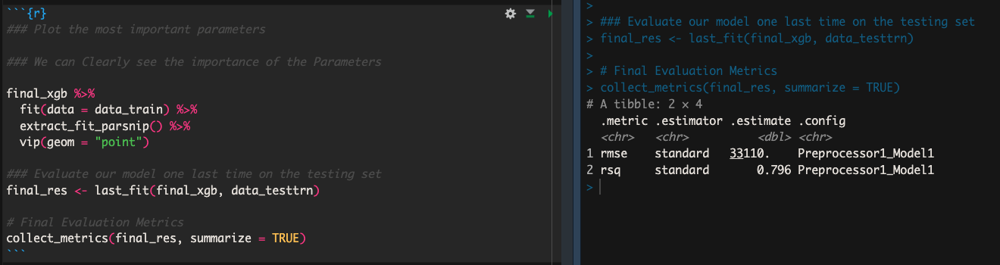

In [72]:
from IPython.display import Image

# Specify the path to the PNG file
img_path = 'XGBoost.png'

# Display the image in Jupyter Notebook
Image(filename=img_path)


## Recommendations and Final Analysis

In conclusion, all of the models contained some sort of unwanted correlation and are not really that reliable or versitle for predicting customer success. 
However, better methods are available. 

It is my theory that by utilizing feature engineering and clustering, Swire should be able to build their own regression/classification models to predict profit, transactions, overall risk, and customer lifetime value more accurately. 

Due to the disparate geographical nature between Swire’s B2B Partners, as well as the strong contributing factor location has on a business’s success, building any model based off of the entire dataset is futile.  

The main argument of my theory is that a cluster (or specific location) containing current B2B Partners will be able to better contribute to the accurate prediction of a potential B2B Partner that Swire is vetting out. If ABC Business is being evaluated by Swire, we can draw on the current knowledge of the cluster to understand if the potential B2B partner, let's say a restaurant, is a good fit for the area. We would compare census data of the area or cluster in question against Coke's target customers or demographics for that area. Next, utilizing Yelp data to understand how well similar current B2B Partners are performing, such as similar restaurants, along with the performance of all restaurants in the area to evaluate general performance. The final piece is evaluating the current B2B Partners’ wait times from Google Analytics. A variety of metrics can be used from Google to understand, overall, how busy and therefore successful a current B2B Partner is. The hypothesis is that the longer the wait times, the busier the Partner is and the more revenue the Partner is generating. 

Overall, the more successful a Current and Potential B2B Partner is predicted to be the more likely Coca-Cola’s sales will be higher. Sales are directly related to customer traffic and perception of the Current and Potential B2B Partner. Therefore, we can sufficiently conclude that predicting the overall success of the B2B Partners will help us to better predict profit, transactions, overall risk, and even customer lifetime value for Swire Coca-Cola.